In [1]:
import os
import json
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
from DGM import DGMNet


class Experiment:
    def __init__(self, folder_path):
        self.folder_path = folder_path
        self.name = os.path.basename(folder_path)

        # Load metadata
        self.metadata = self._load_json("metadata.json")
        self.model_parameters = self.metadata.get("model_parameters", {})
        self.network_parameters = self.metadata.get("network_parameters", {})
        self.training_parameters = self.metadata.get("training_parameters", {})
        self.domain_bounds = self.metadata.get("domain_bounds", {})
        self.experiment_name = self.metadata.get("experiment_name", self.name)

        try:
            self.history = self._load_csv("training_history.csv")
        except Exception:
            self.history = None
            print(f"Missing training history file for {self.experiment_name}")

        self.dtype = self.metadata["training_parameters"].get("dtype", "float32")
        self.dtype = tf.float64 if self.dtype == "float64" else tf.float32

        # Extract model parameters
        self.mu = self.model_parameters["mu"]
        self.sigma = self.model_parameters["sigma"]
        self.C = self.model_parameters["C"]
        self.a = self.model_parameters["a"]
        self.b = self.model_parameters["b"]
        self.r = self.model_parameters["r"]
        self.T = self.model_parameters["T"]
        self.L = self.model_parameters.get("L", 0.5)

        self.V_scale = self.metadata.get("V_scale", 1.0)
        self.alpha_scale = self.metadata.get("alpha_scale", 1.0)

        self.pi_expr = self.model_parameters.get("pi", "P")
        self.pi = self._build_pi_function(self.pi_expr)

        # Normalization
        (t_bounds, P_bounds, Y_bounds) = self.domain_bounds.values()
        self.t_min, self.t_max = t_bounds
        self.P_min, self.P_max = P_bounds
        self.Y_min, self.Y_max = Y_bounds

        self.t_mean = tf.constant((self.t_max + self.t_min) / 2, dtype=self.dtype)
        self.t_scale = tf.constant((self.t_max - self.t_min) / 2, dtype=self.dtype)
        self.P_mean = tf.constant((self.P_max + self.P_min) / 2, dtype=self.dtype)
        self.P_scale = tf.constant((self.P_max - self.P_min) / 2, dtype=self.dtype)
        self.Y_mean = tf.constant((self.Y_max + self.Y_min) / 2, dtype=self.dtype)
        self.Y_scale = tf.constant((self.Y_max - self.Y_min) / 2, dtype=self.dtype)

        self.normalize_inputs = lambda t, P, Y: (
            (t - self.t_mean) / self.t_scale,
            (P - self.P_mean) / self.P_scale,
            (Y - self.Y_mean) / self.Y_scale,
        )

        # Load models
        self.f_theta = self._build_and_load_model("f_theta.keras")
        self.g_phi = self._build_and_load_model("g_phi.keras")

    def plot_history(self):
        if self.history is None:
            print("No training history loaded.")
            return

        # --- Plot value network losses ---
        plt.figure(figsize=(10, 5))
        plt.plot(self.history["total_loss"], label="Total Loss")
        plt.plot(self.history["pde_loss"], label="PDE Loss")
        plt.plot(self.history["terminal_loss"], label="Terminal Loss")
        plt.yscale("log")
        plt.xlabel("Training Step")
        plt.ylabel("Loss")
        plt.title(f"Loss History - {self.experiment_name}")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        # --- Plot control network loss ---
        plt.figure(figsize=(8, 4))
        plt.plot(self.history["control_loss"], label="Control Loss")
        plt.yscale("log")
        plt.xlabel("Training Step")
        plt.ylabel("Loss")
        plt.title(f"Control Loss History - {self.experiment_name}")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    def _build_pi_function(self, expr):
        def pi(P):
            local_dict = {
                "P": P,
                "sqrt": tf.sqrt,
                "log": tf.math.log,
                "exp": tf.exp,
                "abs": tf.abs,
                "pow": tf.pow,
                "min": tf.minimum,
                "max": tf.maximum,
                "tf": tf,
            }
            return eval(expr, {"__builtins__": {}}, local_dict)

        return pi

    def _build_and_load_model(self, filename, final_trans=None):
        path = os.path.join(self.folder_path, filename)
        if not os.path.exists(path):
            raise FileNotFoundError(f"Missing model file: {filename}")

        net = DGMNet(
            layer_width=self.network_parameters["layer_width"],
            n_layers=self.network_parameters["n_layers"],
            input_dim=self.network_parameters["input_dim"],
            final_trans=final_trans,
        )

        dummy_input = tf.zeros(
            (1, self.network_parameters["input_dim"]), dtype=self.dtype
        )
        dummy_t = tf.zeros((1, 1), dtype=self.dtype)
        net(dummy_t, dummy_input)

        net.load_weights(path)
        return net

    def _load_json(self, filename):
        with open(os.path.join(self.folder_path, filename), "r") as f:
            return json.load(f)

    def _load_csv(self, filename):
        return pd.read_csv(os.path.join(self.folder_path, filename))

    def __repr__(self):
        return f"<Experiment '{self.experiment_name}' σ={self.sigma}>"

    def animate_primal_hjb_slice(self, P_points=60, Y_points=60, frames=60):
        tf.config.run_functions_eagerly(True)

        P_vals = np.linspace(self.P_min, self.P_max, P_points)
        Y_vals = np.linspace(self.Y_min, self.Y_max, Y_points)
        P_grid, Y_grid = np.meshgrid(P_vals, Y_vals)

        flat_P = P_grid.reshape(-1, 1)
        flat_Y = Y_grid.reshape(-1, 1)
        dtype = self.dtype

        fig, axes = plt.subplots(
            1, 4, figsize=(18, 5), subplot_kw={"projection": "3d"}
        )
        titles = ["Value Function V", "HJB Residual", "Control α", "Second derivative V_PP"]

        surfaces = [
            axes[i].plot_surface(P_grid, Y_grid, np.zeros_like(P_grid), cmap="viridis")
            for i in range(4)
        ]

        for ax, title in zip(axes, titles):
            ax.set_xlabel("P")
            ax.set_ylabel("Y")
            ax.set_zlabel(title)
            ax.set_title(f"{title} (t = ...)")

        def compute_quantities(t_val):
            t = tf.constant(t_val * np.ones_like(flat_P), dtype=dtype)
            P = tf.constant(flat_P, dtype=dtype)
            Y = tf.constant(flat_Y, dtype=dtype)

            with tf.GradientTape(persistent=True) as tape2:
                tape2.watch([t, P, Y])
                with tf.GradientTape(persistent=True) as tape1:
                    tape1.watch([t, P, Y])

                    # Get normalized inputs and network outputs (tilde variables)
                    t_norm, P_norm, Y_norm = self.normalize_inputs(t, P, Y)
                    V_tilde = self.f_theta(t_norm, tf.concat([P_norm, Y_norm], axis=1))
                    alpha_tilde = self.g_phi(
                        t_norm, tf.concat([P_norm, Y_norm], axis=1)
                    )

                    # Compute gradients of V_tilde
                    V_tilde_t = tape1.gradient(V_tilde, t)
                    V_tilde_P = tape1.gradient(V_tilde, P)
                    V_tilde_Y = tape1.gradient(V_tilde, Y)
                V_tilde_PP = tape2.gradient(V_tilde_P, P)

            # Apply epsilon guard
            eps = tf.constant(1e-6, dtype=dtype)
            sign = tf.sign(V_tilde_PP)
            sign = tf.where(sign == 0, tf.ones_like(sign), sign)
            V_tilde_PP_safe = tf.where(
                tf.abs(V_tilde_PP) < eps, eps * sign, V_tilde_PP
            )

            # PDE coefficients
            drift_coeff = self.alpha_scale * self.mu
            diffusion_coeff = (self.alpha_scale**2 * self.sigma**2) / 2

            # PDE residual
            alpha_tilde = tf.cast(alpha_tilde, dtype)
            drift = drift_coeff * alpha_tilde * P * V_tilde_P
            diffusion = diffusion_coeff * alpha_tilde**2 * P**2 * V_tilde_PP_safe
            advec_Y = self.C * (self.a + self.b * P) * V_tilde_Y
            source_term = self.pi(P) / self.V_scale

            V_tilde = tf.cast(V_tilde, dtype)
            residual = self.V_scale * (
                V_tilde_t + drift + diffusion + advec_Y + source_term - self.r * V_tilde
            )

            # Scaled values
            V = self.V_scale * V_tilde
            alpha = self.alpha_scale * alpha_tilde
            V_PP_safe = self.V_scale * V_tilde_PP_safe

            return (
                tf.reshape(V, P_grid.shape).numpy(),
                tf.reshape(residual, P_grid.shape).numpy(),
                tf.reshape(alpha, P_grid.shape).numpy(),
                tf.reshape(V_PP_safe, P_grid.shape).numpy(),
            )

        def update(frame):
            t_val = self.T * (1 - frame / (frames - 1))
            V_vals, R_vals, A_vals, V_PP_vals = compute_quantities(t_val)

            for surf in surfaces:
                surf.remove()

            for i, (data, title) in enumerate(
                zip([V_vals, R_vals, A_vals, V_PP_vals], titles)
            ):
                data = np.nan_to_num(data, nan=0.0, posinf=1e6, neginf=-1e6)
                surfaces[i] = axes[i].plot_surface(P_grid, Y_grid, data, cmap="viridis")
                axes[i].set_title(f"{title} (t = {t_val:.2f})")

            return surfaces

        ani = animation.FuncAnimation(
            fig, update, frames=frames, interval=120, blit=False
        )
        plt.close(fig)
        return HTML(ani.to_jshtml())


2025-09-22 02:36:22.965061: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
exp = Experiment("/Data/eco-hjb-solver/experiments/base_cst_model")

I0000 00:00:1758501384.681844  698206 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22204 MB memory:  -> device: 0, name: NVIDIA RTX A5000, pci bus id: 0000:01:00.0, compute capability: 8.6


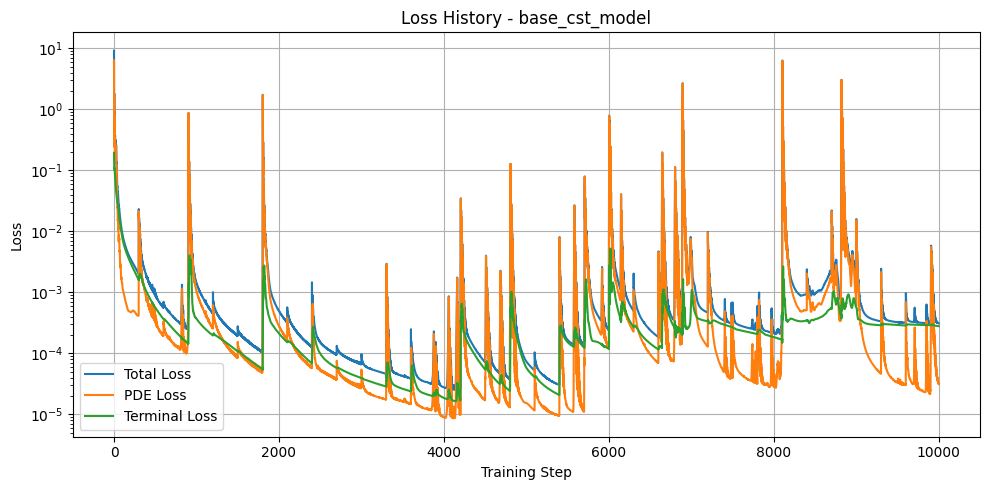

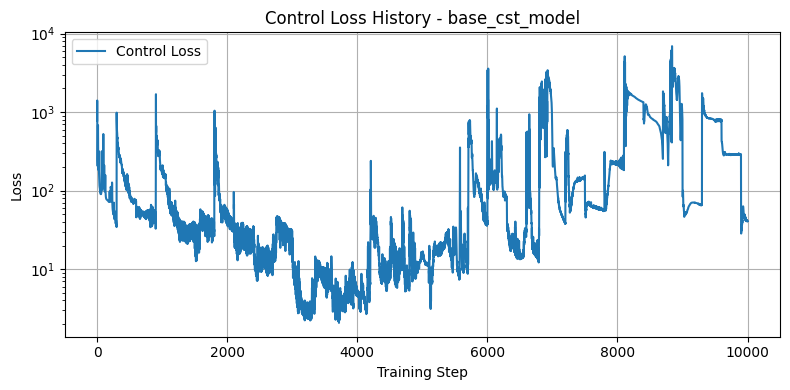

In [3]:
exp.plot_history()

In [4]:
exp.metadata

{'model_parameters': {'mu': 0.05000000074505806,
  'sigma': 0.05000000074505806,
  'a': 0.05000000074505806,
  'b': 0.20000000298023224,
  'r': 0.05000000074505806,
  'T': 1.0,
  'L': 0.5,
  'C': 2.0,
  'pi': 'sqrt(P)'},
 'network_parameters': {'n_layers': 5, 'layer_width': 160, 'input_dim': 2},
 'training_parameters': {'seed': 3,
  'dtype': 'float32',
  'lr_base': 0.000801644264886163,
  'lr_log_delta': 0.17238367591281367,
  'lr_schedule_f': {'initial_learning_rate': 0.0011922446047547511,
   'decay_steps': 950,
   'decay_rate': 0.97},
  'lr_schedule_g': {'initial_learning_rate': 0.0005390114787368392,
   'decay_steps': 450,
   'decay_rate': 0.86},
  'batch_size': 2816,
  'candidate_size': 100000,
  'resample_every': 300,
  'k_start': 1.3,
  'k_end': 3.0,
  'k_schedule_steps': 4500},
 'domain_bounds': {'t': [0.0, 1.0],
  'P': [0.1, 10.0],
  'Y': [0.0, 4.099999904632568]},
 'V_scale': 4.699999809265137,
 'alpha_scale': 0.3455183804035187}

In [ ]:
exp.animate_primal_hjb_slice(P_points=30, Y_points=30, frames=30)

: 